### PROJECTO FINAL CONVECIÓN SOBRE PLACAS SOBRE PLACAS
Por:
* [Luis Alejandro Rodríguez, Cod. 202321287](https://luigitoby.github.io/)
* Daniel Suaza, 
* Santiago Ortegón, 

### Librerías

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D  # necesario para 3D en algunos entornos

### Organización
El notebook esta organizado por puntos, algunos puntos estan subdivididos de forma adicional a la recomendada
en el documento del proyecto pues esto hacía más facil entender como funciona el código y hacerlo más legible.

### Parte1a

### Primer intento modelar conducción

In [2]:


Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1
Ny = 40
Nt = 40

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt

T = np.zeros((Nt + 1, Ny + 1))
T[0, :] = T_inf
T[0, 0] = Tp

for k in range(Nt):
    Th = T[k, :].copy()
    TE = Th.copy()
    TE[0] = Tp
    TE[-1] = T_inf
    for n in range(1, Ny):
        TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])
    T[k+1, :] = TE

Nx = 10
dx = 0.5
x_positions = np.arange(Nx) * dx

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

lines = []
for xi in x_positions:
    X = np.full_like(y, xi, dtype=float)
    line, = ax.plot(X, y, T[0, :], lw=2)
    lines.append(line)

ax.set_xlabel("x (a lo largo de la placa)")
ax.set_ylabel("y (normal a la placa)")
ax.set_zlabel("T")
ax.set_xlim(x_positions[0], x_positions[-1])
ax.set_ylim(y[0], y[-1])
ax.set_zlim(T_inf, Tp * 1.05)
title = ax.set_title(f"t = {t[0]:.1f}")

def update(frame):
    for i, xi in enumerate(x_positions):
        X = np.full_like(y, xi, dtype=float)
        lines[i].set_data(X, y)
        lines[i].set_3d_properties(T[frame, :])
    title.set_text(f"t = {t[frame]:.1f}")
    return lines + [title]

anim = FuncAnimation(fig, update, frames=Nt+1, interval=200, blit=False)
plt.close(fig)

HTML(anim.to_jshtml())


lambda = 0.1


### Intentar cambiar orientación del modelo

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D  # a veces necesario para activar 3D

Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1
Ny = 40
Nt = 40

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt

T = np.zeros((Nt + 1, Ny + 1))
T[0, :] = T_inf
T[0, 0] = Tp

for k in range(Nt):
    Th = T[k, :].copy()
    TE = Th.copy()
    TE[0] = Tp
    TE[-1] = T_inf
    for n in range(1, Ny):
        TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])
    T[k+1, :] = TE

Nx = 10
dx = 0.5
x_positions = np.arange(Nx) * dx

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

lines = []
for xi in x_positions:
    X = np.full_like(y, xi, dtype=float)  # eje x (horizontal)
    Y = T[0, :]                            # eje y (vertical) = T
    Z = y                                  # eje z (profundidad) = distancia normal
    line, = ax.plot(X, Y, Z, lw=2)
    lines.append(line)

ax.set_xlabel("x (a lo largo de la placa)")
ax.set_ylabel("T")
ax.set_zlabel("y (normal a la placa)")

ax.set_xlim(x_positions[0], x_positions[-1])
ax.set_ylim(T_inf, Tp * 1.05)
ax.set_zlim(y[0], y[-1])

ax.view_init(elev=25, azim=-60)  # solo para que se vea más claro
title = ax.set_title(f"t = {t[0]:.1f}")

def update(frame):
    for i, xi in enumerate(x_positions):
        X = np.full_like(y, xi, dtype=float)
        Y = T[frame, :]   # T(y,t) en el eje vertical
        Z = y
        lines[i].set_data(X, Y)          # x, T
        lines[i].set_3d_properties(Z)    # y normal
    title.set_text(f"t = {t[frame]:.1f}")
    return lines + [title]

anim = FuncAnimation(fig, update, frames=Nt+1, interval=200, blit=False)
plt.close(fig)

HTML(anim.to_jshtml())


lambda = 0.1


### Sub-dividir en diferentes gráficas

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1
Ny = 40
Nt = 40

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt

T = np.zeros((Nt + 1, Ny + 1))
T[0, :] = T_inf
T[0, 0] = Tp

for k in range(Nt):
    Th = T[k, :].copy()
    TE = Th.copy()
    TE[0] = Tp
    TE[-1] = T_inf
    for n in range(1, Ny):
        TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])
    T[k+1, :] = TE

Nx_panels = 5
x_positions = np.linspace(0.0, 1.0, Nx_panels)

fig, axes = plt.subplots(1, Nx_panels, figsize=(4 * Nx_panels, 4), sharey=True)
lines = []

for i, ax in enumerate(axes):
    line, = ax.plot(y, T[0, :], lw=2)
    lines.append(line)
    ax.set_xlabel("y (normal a la placa)")
    ax.set_title(f"x = {x_positions[i]:.2f}")

axes[0].set_ylabel("T(y,t)")
fig.suptitle(f"t = {t[0]:.1f}")

def update(frame):
    for line in lines:
        line.set_data(y, T[frame, :])
    fig.suptitle(f"t = {t[frame]:.1f}")
    return lines

anim = FuncAnimation(fig, update, frames=Nt+1, interval=200, blit=False)
plt.close(fig)

HTML(anim.to_jshtml())


lambda = 0.1


### Integración final y resultado final

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1
Ny = 40
Nt = 40

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt

T = np.zeros((Nt + 1, Ny + 1))
T[0, :] = T_inf
T[0, 0] = Tp

for k in range(Nt):
    Th = T[k, :].copy()
    TE = Th.copy()
    TE[0] = Tp
    TE[-1] = T_inf
    for n in range(1, Ny):
        TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])
    T[k+1, :] = TE

Nx_profiles = 10
offsets = np.linspace(0.0, 3.0, Nx_profiles)

fig, ax = plt.subplots(figsize=(7, 5))
lines = []

for off in offsets:
    line, = ax.plot(off + T[0, :], y, lw=2)
    lines.append(line)

ax.set_xlabel("x (perfiles repetidos a lo largo de la placa)")
ax.set_ylabel("y (normal a la placa)")
ax.set_xlim(offsets[0] - 0.2, offsets[-1] + Tp + 0.2)
ax.set_ylim(y[0], y[-1])
title = ax.set_title(f"t = {t[0]:.1f}")

def update(frame):
    for i, off in enumerate(offsets):
        lines[i].set_data(off + T[frame, :], y)
    title.set_text(f"t = {t[frame]:.1f}")
    return lines + [title]

anim = FuncAnimation(fig, update, frames=Nt+1, interval=200, blit=False)
plt.close(fig)

HTML(anim.to_jshtml())


lambda = 0.1


### Parte1b

lambda = 0.1


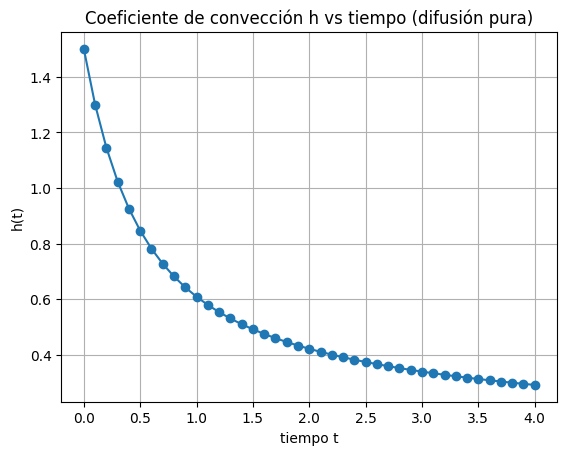

In [6]:
import numpy as np
import matplotlib.pyplot as plt

Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1
Ny = 40
Nt = 40

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt

T = np.zeros((Nt + 1, Ny + 1))
T[0, :] = T_inf
T[0, 0] = Tp

for k in range(Nt):
    Th = T[k, :].copy()
    TE = Th.copy()
    TE[0] = Tp
    TE[-1] = T_inf
    for n in range(1, Ny):
        TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])
    T[k+1, :] = TE

k_f = 1.0

dTdy_0 = np.zeros(Nt + 1)
h = np.zeros(Nt + 1)

for k in range(Nt + 1):
    dTdy_0[k] = (-1.5*T[k, 0] + 2.0*T[k, 1] - 0.5*T[k, 2]) / dy
    h[k] = -k_f * dTdy_0[k] / (Tp - T_inf)

plt.figure()
plt.plot(t, h, marker="o")
plt.xlabel("tiempo t")
plt.ylabel("h(t)")
plt.title("Coeficiente de convección h vs tiempo (difusión pura)")
plt.grid(True)
plt.show()


### Parte2a y Parte2b (2a esta respondido en documento informe)

In [ ]:
Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1

Ny = 40          # nodos en y (0..40)
Nt = 50          # pasos de tiempo
Nx = 40          # "puntos" en x

U_inf = 1.0
dx = U_inf * dt  # para ser consistente con T(x+U dt)

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt
x = np.arange(Nx) * dx

# T[k, i, n] = T en tiempo k, posición x_i, nodo y_n
T = np.zeros((Nt + 1, Nx, Ny + 1))

# Condición inicial: fluido frío, placa caliente en todo x
T[0, :, :] = T_inf
T[0, :, 0] = Tp

for k in range(Nt):
    # -------- Paso 1: CONDUCCIÓN en y para cada x_i --------
    T_cond = np.zeros_like(T[k])
    for i in range(Nx):
        Th = T[k, i, :].copy()
        TE = Th.copy()

        TE[0]  = Tp      # placa
        TE[-1] = T_inf   # medio lejano

        for n in range(1, Ny):
            TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])

        T_cond[i, :] = TE

    # -------- Paso 2: TRANSPORTE en x --------
    # Queremos:
    #  - Columna i=0: siempre fluido frío arriba y placa a Tp (estática)
    #  - Columna i>=1: se llena con lo que había en i-1 después de la conducción

    T_next = np.zeros_like(T_cond)

    # i = 0: condición de entrada (fluido nuevo)
    T_next[0, :] = T_inf
    T_next[0, 0] = Tp

    # i >= 1: transportar perfiles del fluido (y>0) desde la columna anterior
    for i in range(1, Nx):
        # copiamos solo el fluido (n>=1) desde i-1
        T_next[i, 1:] = T_cond[i-1, 1:]
        # placa siempre a Tp
        T_next[i, 0] = Tp

    T[k+1, :, :] = T_next

# -------- ANIMACIÓN: curvas lado a lado sobre el eje x --------
offsets = x  # usamos x como desplazamiento horizontal

fig, ax = plt.subplots(figsize=(10, 5))
lines = []

for i in range(Nx):
    # al inicio k=0
    line, = ax.plot(offsets[i] + T[0, i, :], y, lw=0.7)
    lines.append(line)

ax.set_xlabel("x (a lo largo de la placa)")
ax.set_ylabel("y (normal a la placa)")
ax.set_xlim(offsets[0] - 0.2, offsets[-1] + Tp + 0.5)
ax.set_ylim(y[0], y[-1])
title = ax.set_title(f"t = {t[0]:.1f}")

def update(frame):
    for i in range(Nx):
        lines[i].set_data(offsets[i] + T[frame, i, :], y)
    title.set_text(f"t = {t[frame]:.1f}")
    return lines + [title]

anim = FuncAnimation(fig, update, frames=Nt+1, interval=120, blit=False)
plt.close(fig)

HTML(anim.to_jshtml())


lambda = 0.1


### Parte3a

lambda = 0.1


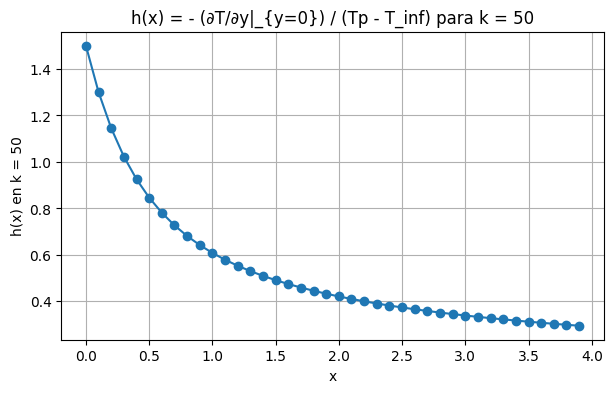

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# ---------------- PARÁMETROS ----------------
Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1

Ny = 40          # nodos en y (0..40)
Nt = 50          # pasos de tiempo (k = 0..50)
Nx = 40          # nodos en x

U_inf = 1.0
dx = U_inf * dt  # Δx = U_inf * Δt

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt
x = np.arange(Nx) * dx

# T[k, i, n] = T en tiempo k, posición x_i, nodo y_n
T = np.zeros((Nt + 1, Nx, Ny + 1))

# Condición inicial: fluido frío, placa caliente en todo x
T[0, :, :] = T_inf
T[0, :, 0] = Tp

# ---------------- CONDUCCIÓN + TRANSPORTE ----------------
for k in range(Nt):
    # Paso 1: CONDUCCIÓN en y para cada x_i
    T_cond = np.zeros_like(T[k])
    for i in range(Nx):
        Th = T[k, i, :].copy()
        TE = Th.copy()

        TE[0]  = Tp      # placa
        TE[-1] = T_inf   # medio lejano

        for n in range(1, Ny):
            TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])

        T_cond[i, :] = TE

    # Paso 2: TRANSPORTE en x
    # i = 0: fluido nuevo (frío) + placa caliente
    T_next = np.zeros_like(T_cond)
    T_next[0, :] = T_inf
    T_next[0, 0] = Tp

    # i >= 1: copiar fluido (n>=1) desde la columna anterior, placa fija a Tp
    for i in range(1, Nx):
        T_next[i, 1:] = T_cond[i-1, 1:]
        T_next[i, 0]  = Tp

    T[k+1, :, :] = T_next

# ---------------- PARTE 3a: h(x) EN k = 50 ----------------
time_index = 50  # k = 50
k_f = 1.0        # k_f = 1 → h = - dT/dy / (Tp - T_inf)

dTdy_0 = np.zeros(Nx)
h_x = np.zeros(Nx)

for i in range(Nx):
    T0 = T[time_index, i, 0]
    T1 = T[time_index, i, 1]
    T2 = T[time_index, i, 2]
    dTdy_0[i] = (-1.5 * T0 + 2.0 * T1 - 0.5 * T2) / dy   # ∂T/∂y|_{y=0}
    h_x[i] = -k_f * dTdy_0[i] / (Tp - T_inf)            # h(x_i)

plt.figure(figsize=(7, 4))
plt.plot(x, h_x, marker="o")
plt.xlabel("x")
plt.ylabel("h(x) en k = 50")
plt.title("h(x) = - (∂T/∂y|_{y=0}) / (Tp - T_inf) para k = 50")
plt.grid(True)
plt.show()


### Parte3b

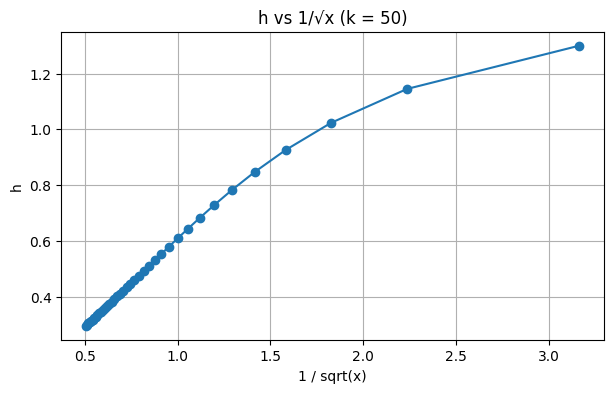

Ajuste h ≈ a * (1/√x) + b
a = 0.4491322922017203
b = 0.11117425956630435


In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Usamos solo x > 0
mask = x > 0.0
x_pos = x[mask]
h_pos = h_x[mask]

inv_sqrt_x = 1.0 / np.sqrt(x_pos)

plt.figure(figsize=(7, 4))
plt.plot(inv_sqrt_x, h_pos, "-o")  # línea + puntos unidos
plt.xlabel("1 / sqrt(x)")
plt.ylabel("h")
plt.title("h vs 1/√x (k = 50)")
plt.grid(True)
plt.show()

# (opcional) Ajuste lineal
coef = np.polyfit(inv_sqrt_x, h_pos, 1)
a, b = coef
print("Ajuste h ≈ a * (1/√x) + b")
print("a =", a)
print("b =", b)


### Parte3c Note que es la misma

lambda = 0.1


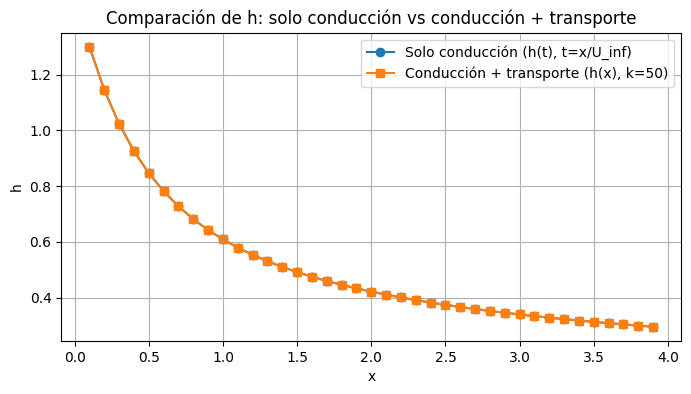

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# ---------------- PARÁMETROS COMUNES ----------------
Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1

Ny = 40
Nt = 50            # k = 0..50
Nx = 40            # nodos en x

U_inf = 1.0
dx = U_inf * dt    # Δx = U_inf * Δt

lam = alpha * dt / dy**2
print("lambda =", lam)

y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt
x = np.arange(Nx) * dx

# =====================================================
# 1) SOLO CONDUCCIÓN EN Y (SEMIESPACIO) → h_cond(t)
# =====================================================
T_cond1D = np.zeros((Nt + 1, Ny + 1))
T_cond1D[0, :] = T_inf
T_cond1D[0, 0] = Tp

for k in range(Nt):
    Th = T_cond1D[k, :].copy()
    TE = Th.copy()
    TE[0]  = Tp
    TE[-1] = T_inf
    for n in range(1, Ny):
        TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])
    T_cond1D[k+1, :] = TE

k_f = 1.0
h_cond_t = np.zeros(Nt + 1)

for k in range(Nt + 1):
    T0 = T_cond1D[k, 0]
    T1 = T_cond1D[k, 1]
    T2 = T_cond1D[k, 2]
    dTdy0 = (-1.5*T0 + 2.0*T1 - 0.5*T2) / dy
    h_cond_t[k] = -k_f * dTdy0 / (Tp - T_inf)

# =====================================================
# 2) CONDUCCIÓN + TRANSPORTE → h_conv(x) en k = 50
# =====================================================
T = np.zeros((Nt + 1, Nx, Ny + 1))
T[0, :, :] = T_inf
T[0, :, 0] = Tp

for k in range(Nt):
    # Paso 1: conducción en y
    T_cond = np.zeros_like(T[k])
    for i in range(Nx):
        Th = T[k, i, :].copy()
        TE = Th.copy()
        TE[0]  = Tp
        TE[-1] = T_inf
        for n in range(1, Ny):
            TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])
        T_cond[i, :] = TE

    # Paso 2: transporte en x
    T_next = np.zeros_like(T_cond)
    T_next[0, :] = T_inf
    T_next[0, 0] = Tp
    for i in range(1, Nx):
        T_next[i, 1:] = T_cond[i-1, 1:]
        T_next[i, 0]  = Tp

    T[k+1, :, :] = T_next

time_index = 50
h_conv_x = np.zeros(Nx)

for i in range(Nx):
    T0 = T[time_index, i, 0]
    T1 = T[time_index, i, 1]
    T2 = T[time_index, i, 2]
    dTdy0 = (-1.5*T0 + 2.0*T1 - 0.5*T2) / dy
    h_conv_x[i] = -k_f * dTdy0 / (Tp - T_inf)

# =====================================================
# 3) COMPARACIÓN: h_cond(t=x/U_inf) vs h_conv(x)
# =====================================================
# x = i*dx, t_equiv = x/U_inf = i*dt → índice de tiempo ~ i
# usamos i = 1..Nx-1 para evitar x=0
i_min = 1
i_max = min(Nx-1, Nt)   # por si Nx > Nt

x_common = x[i_min:i_max+1]
h_cond_on_x = h_cond_t[i_min:i_max+1]   # h_cond(t = i*dt)
h_conv_on_x = h_conv_x[i_min:i_max+1]

plt.figure(figsize=(8, 4))
plt.plot(x_common, h_cond_on_x, "-o", label="Solo conducción (h(t), t=x/U_inf)")
plt.plot(x_common, h_conv_on_x, "-s", label="Conducción + transporte (h(x), k=50)")
plt.xlabel("x")
plt.ylabel("h")
plt.title("Comparación de h: solo conducción vs conducción + transporte")
plt.grid(True)
plt.legend()
plt.show()


### Parte4

lambda = 0.1


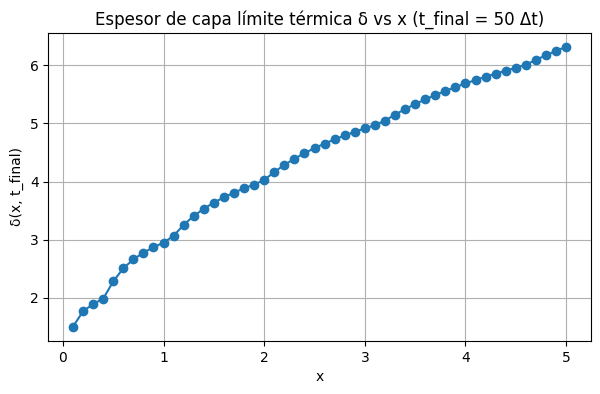

In [12]:
Tp = 1.0
T_inf = 0.0
alpha = 1.0

dy = 1.0
dt = 0.1

Ny = 40           # nodos en y (0..40)
Nt = 50           # pasos de tiempo k = 0..50
U_inf = 1.0
dx = U_inf * dt   # Δx = U_inf * Δt

Nx = Nt + 1       # puntos en x para k = 0..50
y = np.arange(Ny + 1) * dy
t = np.arange(Nt + 1) * dt
x = np.arange(Nx) * dx

lam = alpha * dt / dy**2
print("lambda =", lam)

# T[k, i, n] = T en tiempo k, posición x_i, nodo y_n
T = np.zeros((Nt + 1, Nx, Ny + 1))

# Condición inicial: fluido frío, placa caliente en todo x
T[0, :, :] = T_inf
T[0, :, 0] = Tp

# -------- Conducción + transporte --------
for k in range(Nt):
    # Conducción en y
    T_cond = np.zeros_like(T[k])
    for i in range(Nx):
        Th = T[k, i, :].copy()
        TE = Th.copy()

        TE[0]  = Tp
        TE[-1] = T_inf

        for n in range(1, Ny):
            TE[n] = Th[n] + lam * (Th[n+1] - 2.0*Th[n] + Th[n-1])

        T_cond[i, :] = TE

    # Transporte en x
    T_next = np.zeros_like(T_cond)

    # x = 0: fluido nuevo (frío) + placa caliente
    T_next[0, :] = T_inf
    T_next[0, 0] = Tp

    # x > 0: se copia el fluido desde la columna anterior, placa fija
    for i in range(1, Nx):
        T_next[i, 1:] = T_cond[i-1, 1:]
        T_next[i, 0]  = Tp

    T[k+1, :, :] = T_next

# -------- Parte 4: δ(x, t_final) para t_final = 50 Δt --------
time_index = Nt           # k = 50
target_T = 0.05           # 0.05(Tp - T_inf) con Tp=1, T_inf=0

delta = np.full(Nx, np.nan)

for i in range(1, Nx):    # desde x = dx hasta x = 50 dx
    profile = T[time_index, i, :]
    below = np.where(profile <= target_T)[0]

    if below.size == 0:
        # nunca baja de 0.05 en el dominio → δ fuera de la malla
        delta[i] = y[-1]
    else:
        n = below[0]
        if n == 0:
            delta[i] = 0.0
        else:
            # interpolación lineal entre y_{n-1} y y_n
            T1, T2 = profile[n-1], profile[n]
            y1, y2 = y[n-1], y[n]
            if T1 == T2:
                delta[i] = y1
            else:
                delta[i] = y1 + (target_T - T1) * (y2 - y1) / (T2 - T1)

# Quitamos x=0 porque δ no está bien definido allí
x_plot = x[1:]
delta_plot = delta[1:]

plt.figure(figsize=(7, 4))
plt.plot(x_plot, delta_plot, "-o")
plt.xlabel("x")
plt.ylabel("δ(x, t_final)")
plt.title("Espesor de capa límite térmica δ vs x (t_final = 50 Δt)")
plt.grid(True)
plt.show()


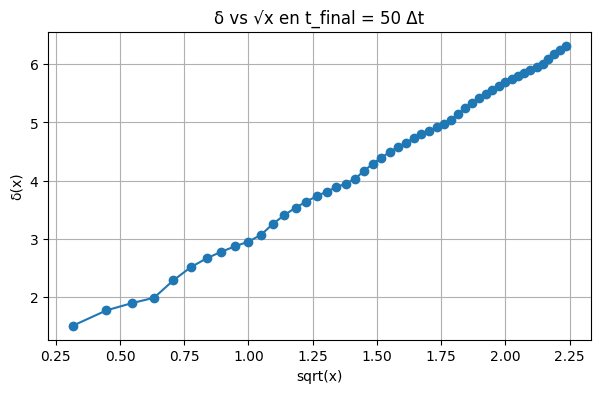

Ajuste δ ≈ a * √x + b
a = 2.597811698114295
b = 0.45191613577402157


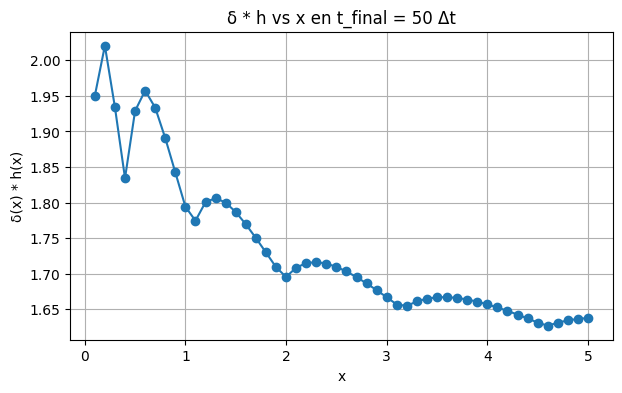

Promedio de δ*h: 1.7338249193971058
Desviación estándar de δ*h: 0.10287754329973131


In [14]:
# ---------- h(x) en el mismo tiempo final (k = Nt = 50) ----------
time_index = Nt
k_f = 1.0

h_x = np.zeros(Nx)
for i in range(Nx):
    T0 = T[time_index, i, 0]
    T1 = T[time_index, i, 1]
    T2 = T[time_index, i, 2]
    dTdy0 = (-1.5*T0 + 2.0*T1 - 0.5*T2) / dy
    h_x[i] = -k_f * dTdy0 / (Tp - T_inf)

# Quitamos x = 0 (no definido) y posibles NaN en delta
mask = (x > 0.0) & ~np.isnan(delta)
x_plot = x[mask]
delta_plot = delta[mask]
h_plot = h_x[mask]

# ---------- 1) Gráfica δ vs sqrt(x) ----------
sqrt_x = np.sqrt(x_plot)

plt.figure(figsize=(7, 4))
plt.plot(sqrt_x, delta_plot, "-o")
plt.xlabel("sqrt(x)")
plt.ylabel("δ(x)")
plt.title("δ vs √x en t_final = 50 Δt")
plt.grid(True)
plt.show()

# (opcional) ajuste lineal δ ≈ a*sqrt(x) + b
coef_delta = np.polyfit(sqrt_x, delta_plot, 1)
a_delta, b_delta = coef_delta
print("Ajuste δ ≈ a * √x + b")
print("a =", a_delta)
print("b =", b_delta)

# ---------- 2) Gráfica δ * h vs x ----------
delta_h = delta_plot * h_plot

plt.figure(figsize=(7, 4))
plt.plot(x_plot, delta_h, "-o")
plt.xlabel("x")
plt.ylabel("δ(x) * h(x)")
plt.title("δ * h vs x en t_final = 50 Δt")
plt.grid(True)
plt.show()

print("Promedio de δ*h:", np.mean(delta_h))
print("Desviación estándar de δ*h:", np.std(delta_h))


### Parte5